In [1]:
#importing libr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
import seaborn as sns
sns.set(style='whitegrid')
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from tqdm import tqdm
from sklearn.utils import shuffle
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [2]:
trainpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_train/seg_train'
testpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_test/seg_test'
predpath='C:/Users/Farah/python/deep learning/CNN/archive/seg_pred/seg_pred'

In [3]:
print(os.listdir(testpath))

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [4]:
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [5]:
seg_test_path = os.path.join(testpath)

for folder in os.listdir(seg_test_path):
    folder_path = os.path.join(seg_test_path, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For testing data, found {len(files)} in folder {folder}')

For testing data, found 437 in folder buildings
For testing data, found 474 in folder forest
For testing data, found 553 in folder glacier
For testing data, found 525 in folder mountain
For testing data, found 510 in folder sea
For testing data, found 501 in folder street


In [6]:
seg_pred_path = os.path.join(predpath)
files = gb.glob(os.path.join(seg_pred_path, '*.jpg'))
print(f'For predincting data, found {len(files)} in folder {folder}')

For predincting data, found 7301 in folder street


In [7]:
seg_train_path = os.path.join(trainpath)

for folder in os.listdir(seg_train_path):
    folder_path = os.path.join(seg_train_path, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For training data, found {len(files)} in folder {folder}')

For training data, found 2191 in folder buildings
For training data, found 2271 in folder forest
For training data, found 2404 in folder glacier
For training data, found 2512 in folder mountain
For training data, found 2274 in folder sea
For training data, found 2382 in folder street


In [9]:
#checking images
code={'buildings':0, 'forest':1, 'glacier':2, 'mountain':3, 'sea':4, 'street':5}
def getcode(n):
    for x,y in code.items():
        if n==y:
            return x

# Load Data

In [10]:
s=100
def load_data():
    output=[]
    dataset=[trainpath,testpath]
    for path in dataset:
        X,y=[],[]
        for folder in tqdm(os.listdir(os.path.join(path))):
            folder_path=os.path.join(path,folder)
            files=gb.glob(os.path.join(folder_path, '*.jpg'))
            for file in files:
                img=cv2.imread(file)
                if img is None: 
                    continue
                img_array=cv2.resize(img,(s,s))
                X.append(img_array)
                y.append(code[folder])
        X = np.array(X)
        y = np.array(y)
        output.append((X, y))
    return output

In [11]:
(X_train, y_train), (X_test, y_test) = load_data()

100%|██████████| 6/6 [00:17<00:00,  2.89s/it]


In [12]:
X_pred=[]
files = gb.glob(os.path.join(predpath, '*.jpg'))
for file in files:
    img=cv2.imread(file)
    img_array=cv2.resize(img,(s,s))
    X_pred.append(list(img_array))

In [13]:
X_pred=np.array(X_pred)

In [14]:
X_pred.shape

(7301, 100, 100, 3)

In [15]:
X_train, y_train = shuffle(X_train, y_train, random_state=25)

In [16]:
X_train.shape

(14034, 100, 100, 3)

In [17]:
X_test.shape

(3000, 100, 100, 3)

# Plot Sample Image

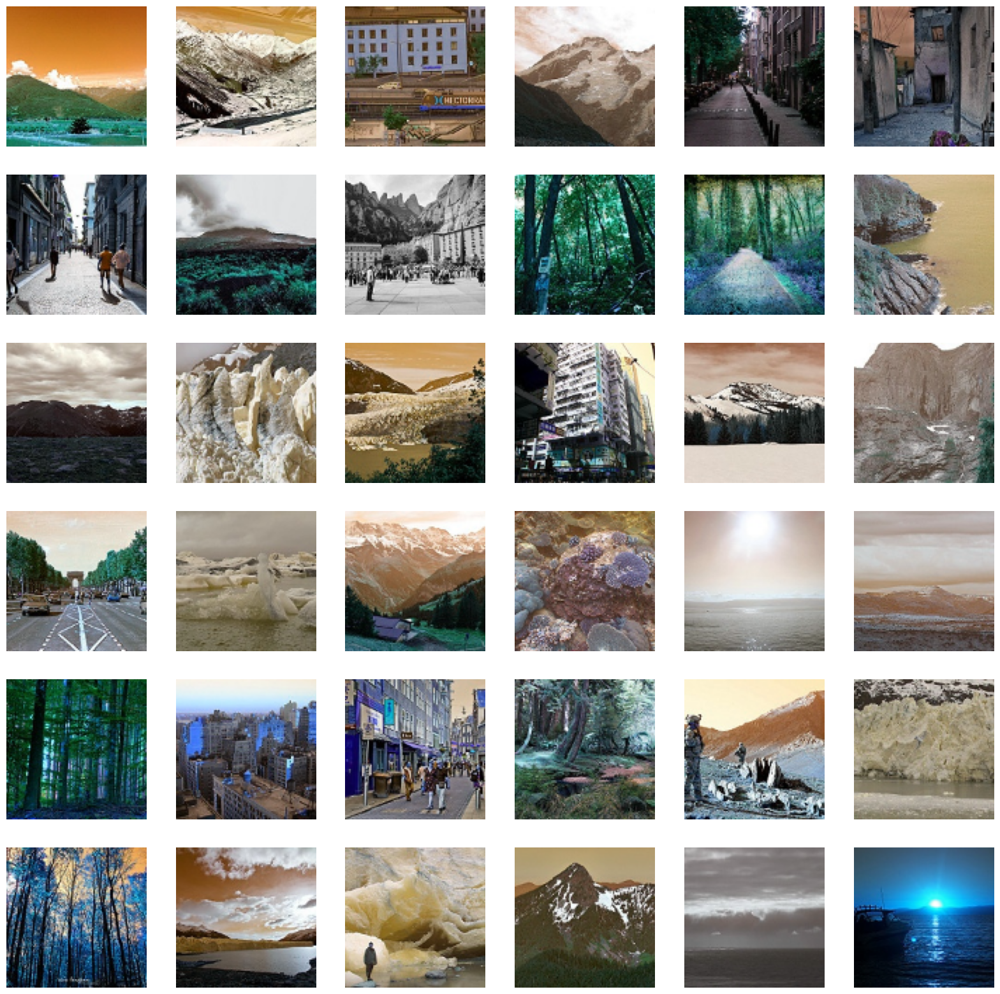

In [18]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_pred),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

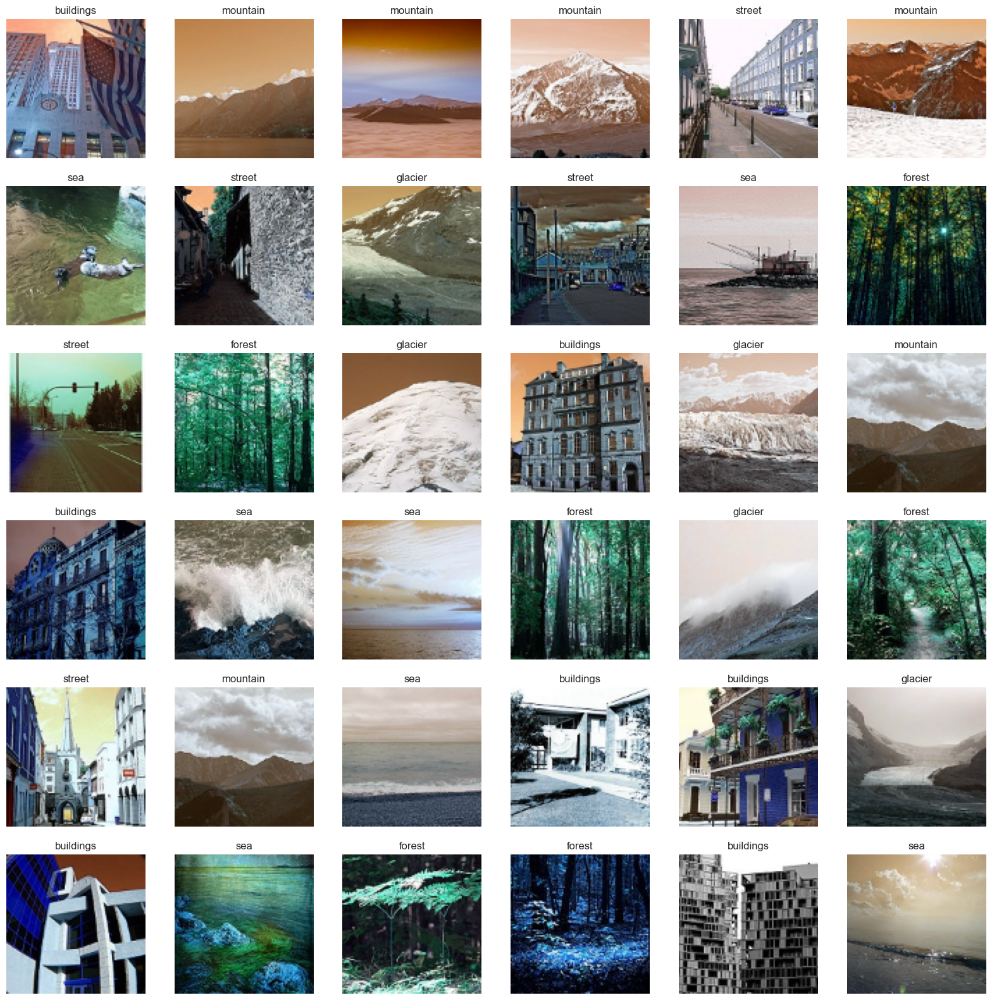

In [19]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

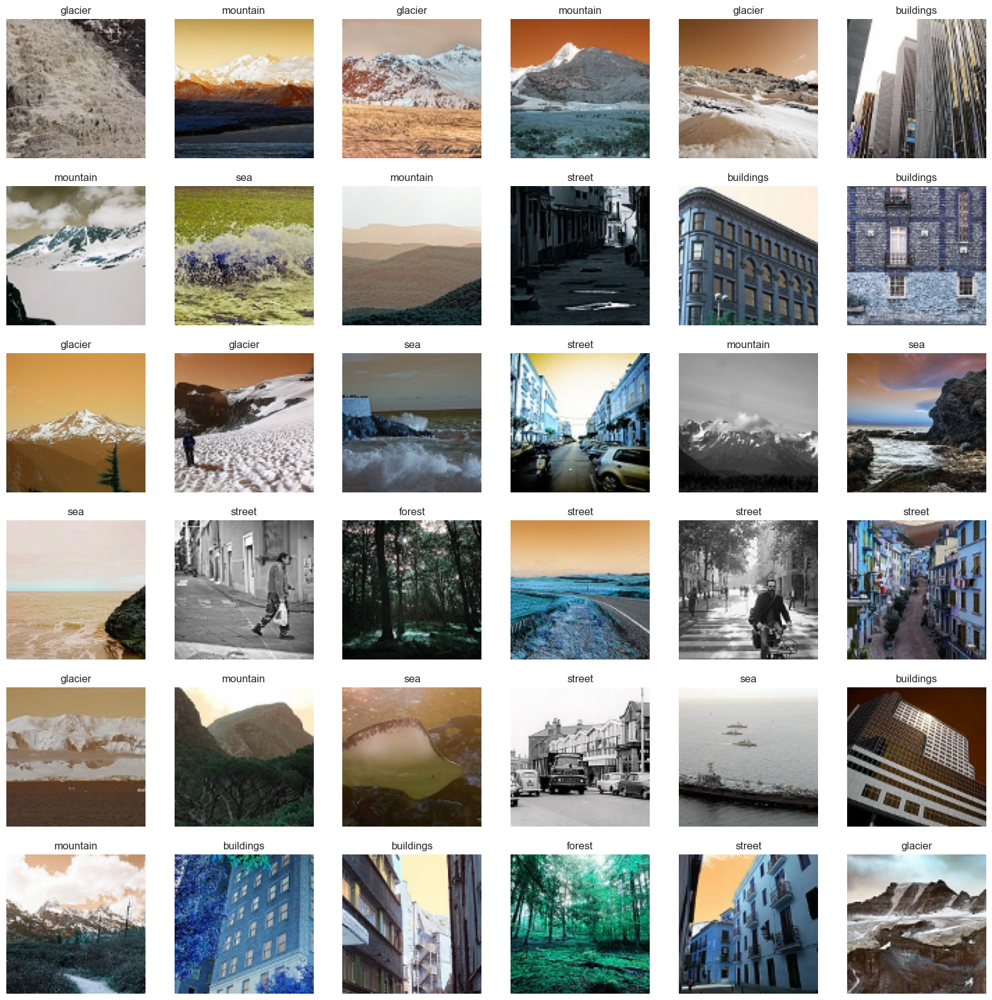

In [20]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(X_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

# Model Training

In [21]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

In [22]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [23]:
print(KerasModel.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                                        

In [24]:
#Callbacks
earlystop = EarlyStopping(patience=10)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.1, 
                                            min_lr=0.00001)

In [25]:
callbacks = [earlystop, learning_rate_reduction]

In [26]:
%%time
#Fit Model
epochs = 10
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1, callbacks=callbacks)

Epoch 1/10
220/220 [==============================] - 2796s 13s/step - loss: 1.7301 - accuracy: 0.3462 - lr: 0.0010
Epoch 2/10
220/220 [==============================] - 2835s 13s/step - loss: 1.1302 - accuracy: 0.5334 - lr: 0.0010
Epoch 3/10
220/220 [==============================] - 3280s 15s/step - loss: 1.0058 - accuracy: 0.5971 - lr: 0.0010
Epoch 4/10
220/220 [==============================] - 2908s 13s/step - loss: 0.8971 - accuracy: 0.6568 - lr: 0.0010
Epoch 5/10
220/220 [==============================] - 3198s 15s/step - loss: 0.7889 - accuracy: 0.7247 - lr: 0.0010
Epoch 6/10
220/220 [==============================] - 2739s 12s/step - loss: 0.6922 - accuracy: 0.7575 - lr: 0.0010
Epoch 7/10
220/220 [==============================] - 2639s 12s/step - loss: 0.6329 - accuracy: 0.7810 - lr: 0.0010
Epoch 8/10
220/220 [==============================] - 2671s 12s/step - loss: 0.5810 - accuracy: 0.8016 - lr: 0.0010
Epoch 9/10
220/220 [==============================] - 3130s 14s/step - l

In [27]:
#Save the Model
KerasModel.save('predict.h5')

# Model Testing

In [28]:
#Model Evaluation
modelloss,modelAccuracy=KerasModel.evaluate(X_test,y_test)
print('test loss: {}'.format(modelloss))
print('test accuracy: {}'.format(modelAccuracy))

94/94 [==============================] - 314s 3s/step - loss: 0.5969 - accuracy: 0.7827
test loss: 0.596937358379364
test accuracy: 0.7826666831970215


In [29]:
#Making Predictions
y_pred = KerasModel.predict(X_test)
pred_label = np.argmax(y_pred, axis = 1)

94/94 [==============================] - 242s 2s/step


In [30]:
test_label = np.argmax(y_pred, axis = 1)

In [31]:
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [32]:
y_pred=np.argmax(y_pred,axis=1)
y_pred

array([0, 5, 0, ..., 3, 0, 1], dtype=int64)

In [33]:
#Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred, target_names = class_names))

              precision    recall  f1-score   support

   buildings       0.84      0.75      0.79       437
      forest       0.84      0.97      0.90       474
     glacier       0.88      0.58      0.70       553
    mountain       0.60      0.89      0.72       525
         sea       0.82      0.75      0.78       510
      street       0.85      0.78      0.81       501

    accuracy                           0.78      3000
   macro avg       0.81      0.79      0.78      3000
weighted avg       0.80      0.78      0.78      3000



In [54]:
y_pred

array([0, 5, 0, ..., 3, 0, 1], dtype=int64)

In [55]:
y_test

array([0, 0, 0, ..., 5, 5, 5])

Images classified


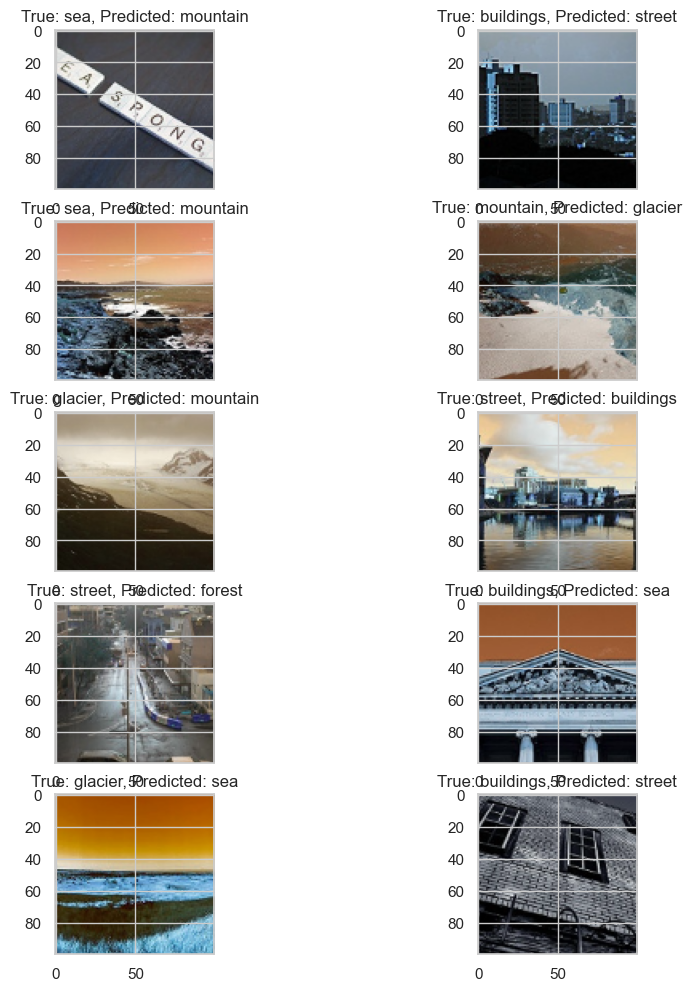

In [75]:
import random
def clss(classi, y_pred, x_test, y_test):
    if classi == 'correct':
        indices = np.where(y_pred == y_test)[0]
    else:
        indices = np.where(y_pred != y_test)[0]

    test_images = [x_test[i] for i in indices]
    image_label_origi = [y_test[i] for i in indices]
    image_label_pred = [y_pred[i] for i in indices]

    print('Images classified')

    # Plot some of the misclassified images
    fig, ax = plt.subplots(5, 2, figsize=(10, 12))
    for i in range(5):
        for j in range(2):
            l = random.randint(0, len(test_images) - 1)
            ax[i, j].imshow(test_images[l])
            ax[i, j].set_title(f"True: {getcode(image_label_origi[l])}, Predicted: {getcode(image_label_pred[l])}")
            #plt.axis('off')

    plt.show()

# Assuming X_test and y_test are available in your environment
# and y_pred is the predicted labels
clss('incorrect', y_pred, X_test, y_test)
   